# Global_PowerPlant_Database_Project

Global Power Plant Database
Project Description
The Global Power Plant Database is a comprehensive, open source database of power plants around the world. 
It centralizes power plant data to make it easier to navigate, compare and draw insights for one’s own analysis.
The database covers approximately 14,000 power plants from 3 countries(USA, AUS, INDIA) and includes thermal plants
(e.g. coal, gas, oil, nuclear, biomass, waste, geothermal) and renewables (e.g. hydro, wind, solar). 
Each power plant is geolocated and entries contain information on plant capacity, generation, ownership, and
fuel type. It will be continuously updated as data becomes available.

Key attributes of the database

The database includes the following indicators:
•	`country` (text): 3 character country code corresponding to the ISO 3166-1 alpha-3 specification [5]
•	`country_long` (text): longer form of the country designation
•	`name` (text): name or title of the power plant, generally in Romanized form
•	`gppd_idnr` (text): 10 or 12 character identifier for the power plant
•	`capacity_mw` (number): electrical generating capacity in megawatts
•	`latitude` (number): geolocation in decimal degrees; WGS84 (EPSG:4326)
•	`longitude` (number): geolocation in decimal degrees; WGS84 (EPSG:4326)
•	`primary_fuel` (text): energy source used in primary electricity generation or export
•	`other_fuel1` (text): energy source used in electricity generation or export
•	`other_fuel2` (text): energy source used in electricity generation or export
•	`other_fuel3` (text): energy source used in electricity generation or export
•	 `commissioning_year` (number): year of plant operation, weighted by unit-capacity when data is available
•	`owner` (text): majority shareholder of the power plant, generally in Romanized form
•	`source` (text): entity reporting the data; could be an organization, report, or document, generally in Romanized form
•	`url` (text): web document corresponding to the `source` field
•	`geolocation_source` (text): attribution for geolocation information
•	`wepp_id` (text): a reference to a unique plant identifier in the widely-used PLATTS-WEPP database.
•	`year_of_capacity_data` (number): year the capacity information was reported
•	`generation_gwh_2013` (number): electricity generation in gigawatt-hours reported for the year 2013
•	`generation_gwh_2014` (number): electricity generation in gigawatt-hours reported for the year 2014
•	`generation_gwh_2015` (number): electricity generation in gigawatt-hours reported for the year 2015
•	`generation_gwh_2016` (number): electricity generation in gigawatt-hours reported for the year 2016
•	`generation_gwh_2017` (number): electricity generation in gigawatt-hours reported for the year 2017
•	`generation_gwh_2018` (number): electricity generation in gigawatt-hours reported for the year 2018
•	`generation_gwh_2019` (number): electricity generation in gigawatt-hours reported for the year 2019
•	`generation_data_source` (text): attribution for the reported generation information
•	`estimated_generation_gwh_2013` (number): estimated electricity generation in gigawatt-hours for the year 2013
•	`estimated_generation_gwh_2014` (number): estimated electricity generation in gigawatt-hours for the year 2014 
•	`estimated_generation_gwh_2015` (number): estimated electricity generation in gigawatt-hours for the year 2015 
•	`estimated_generation_gwh_2016` (number): estimated electricity generation in gigawatt-hours for the year 2016 
•	`estimated_generation_gwh_2017` (number): estimated electricity generation in gigawatt-hours for the year 2017 
•	'estimated_generation_note_2013` (text): label of the model/method used to estimate generation for the year 2013
•	`estimated_generation_note_2014` (text): label of the model/method used to estimate generation for the year 2014 
•	`estimated_generation_note_2015` (text): label of the model/method used to estimate generation for the year 2015
•	`estimated_generation_note_2016` (text): label of the model/method used to estimate generation for the year 2016
•	`estimated_generation_note_2017` (text): label of the model/method used to estimate generation for the year 2017 

Fuel Type Aggregation

We define the "Fuel Type" attribute of our database based on common fuel categories. 
Prediction :   Make two prediction  1) Primary Fuel    2) capacity_mw 

Hint : Use pandas methods to combine all the datasets and then start working on this project.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
from imblearn.over_sampling import SMOTE

In [3]:
df1 = pd.read_csv("USA_Database.csv")
df1.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,USA,United States of America,10 Briggs Solar NG LLC (East),USA0062781,0.0,41.6327,-71.4963,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,USA,United States of America,100 Brook Hill Drive Solar,USA0063292,2.0,41.0930,-73.9828,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,2.467,U.S. Energy Information Administration,NaN
2,USA,United States of America,1001 Ebenezer Church Solar,USA0063444,0.0,36.2838,-80.8434,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,USA,United States of America,1008 Matthews Solar,USA0063447,0.0,36.2167,-80.5525,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,USA,United States of America,1009 Yadkin Solar,USA0063445,0.0,36.1475,-80.6561,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,USA,United States of America,1025 Traveller Solar LLC,USA0062660,5.0,35.4273,-79.1263,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,1.332,U.S. Energy Information Administration,NaN
6,USA,United States of America,1045 Tomlin Mill Solar,USA0063448,0.0,35.9162,-80.8355,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,USA,United States of America,1047 Little Mountain Solar LLC,USA0062661,3.0,36.1971,-80.8067,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,1.417,U.S. Energy Information Administration,NaN
8,USA,United States of America,1073 Onslow Solar,USA0063446,0.0,34.7736,-77.1858,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,USA,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,NaN,NaN,...,2019.0,2.41461,2.35,2.43,2.492,2.276,2.207,2.349,U.S. Energy Information Administration,NaN


In [4]:
df2 = pd.read_csv("IND_Database.csv")
df2.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.5,28.1839,73.2407,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.0,24.7663,74.6090,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.2,21.9038,69.3732,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.0,23.8712,91.3602,Gas,NaN,NaN,...,2019.0,2.41461,617.789264,843.7470,886.004428,663.774500,626.239128,NaN,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.3700,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
5,IND,India,AKRIMOTA LIG,IND0000003,250.0,23.7689,68.6447,Coal,Oil,NaN,...,2019.0,1.52800,1153.421000,1208.8520,1175.765000,1147.913000,976.655000,NaN,Central Electricity Authority,NaN
6,IND,India,ALIYAR,IND0000004,60.0,10.4547,77.0078,Hydro,NaN,NaN,...,2019.0,5.03600,157.558250,152.1952,61.421350,89.629600,48.327150,NaN,Central Electricity Authority,NaN
7,IND,India,ALLAIN DUHANGAN,IND0000005,192.0,32.2258,77.2070,Hydro,NaN,NaN,...,2019.0,0.21500,674.391100,721.3352,675.724400,679.594950,579.318850,NaN,Central Electricity Authority,NaN
8,IND,India,ALMATTI DAM,IND0000006,290.0,16.3300,75.8863,Hydro,NaN,NaN,...,2019.0,NaN,480.594950,144.4342,402.029750,439.372100,406.377900,NaN,Central Electricity Authority,NaN
9,IND,India,AMAR KANTAK,IND0000007,210.0,23.1642,81.6373,Coal,Oil,NaN,...,2019.0,NaN,1887.904000,1643.0460,1338.093000,1563.457000,1487.880000,NaN,Central Electricity Authority,NaN


In [5]:
df3 = pd.read_csv("AUS_Database.csv")
df3.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,AUS,Australia,Adelaide Airport,AUS0000433,0.11,-34.9387,138.5377,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AUS,Australia,Adelaide Showgrounds,AUS0000432,1.00,-34.9453,138.5882,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AUS,Australia,Albany Wind Farm,AUS0000065,21.60,-35.0641,117.7977,Wind,NaN,NaN,...,2019.0,89.595278,102.642778,96.555556,95.872778,85.900278,92.682222,NaN,Australia Clean Energy Regulator,NaN
3,AUS,Australia,Alice Springs Airport,AUS0000469,0.24,-23.7966,133.8971,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AUS,Australia,Amcor Gawler,AUS0000231,4.00,-34.5509,138.7659,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,AUS,Australia,Angaston,AUS0000232,50.00,-34.5034,139.0246,Oil,NaN,NaN,...,2019.0,NaN,NaN,1.653056,5.300833,7.649722,2.222222,NaN,Australia Clean Energy Regulator,NaN
6,AUS,Australia,Anglesea,AUS0000114,165.00,-38.3861,144.1828,Coal,NaN,NaN,...,2019.0,1095.676944,1239.962778,1260.261111,167.880000,NaN,NaN,NaN,Australia Clean Energy Regulator,NaN
7,AUS,Australia,Angurugu,AUS0000615,3.60,-13.8584,136.4209,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,AUS,Australia,Appin (Mine),AUS0000264,55.60,-34.2082,150.7722,Gas,NaN,NaN,...,2019.0,204.804444,238.294444,163.583611,158.933056,64.534722,99.470000,NaN,Australia Clean Energy Regulator,NaN
9,AUS,Australia,Ararat Wind Farm,AUS0000611,240.00,-37.2385,143.0794,Wind,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
print("shape of df1:",df1.shape)
print("shape of df2:",df2.shape)
print("shape of df3:",df3.shape)

shape of df1: (11879, 27)
shape of df2: (907, 27)
shape of df3: (512, 27)


In [7]:
df = pd.concat([df1, df2, df3], ignore_index=True)

In [8]:
df

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,USA,United States of America,10 Briggs Solar NG LLC (East),USA0062781,0.00,41.6327,-71.4963,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,USA,United States of America,100 Brook Hill Drive Solar,USA0063292,2.00,41.0930,-73.9828,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,2.467,U.S. Energy Information Administration,NaN
2,USA,United States of America,1001 Ebenezer Church Solar,USA0063444,0.00,36.2838,-80.8434,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,USA,United States of America,1008 Matthews Solar,USA0063447,0.00,36.2167,-80.5525,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,USA,United States of America,1009 Yadkin Solar,USA0063445,0.00,36.1475,-80.6561,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13293,AUS,Australia,Yarrawonga,AUS0000101,9.00,-36.0094,145.9995,Hydro,NaN,NaN,...,2019.0,38.216111,44.224722,50.183889,46.035278,31.444722,37.317778,NaN,Australia Clean Energy Regulator,NaN
13294,AUS,Australia,Yarwun,AUS0000173,154.00,-23.8306,151.1519,Gas,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13295,AUS,Australia,Yuendumu,AUS0000465,0.24,-22.2426,131.7931,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,5.216667,5.176944,5.341111,NaN,Australia Clean Energy Regulator,NaN
13296,AUS,Australia,Yulara,AUS0000257,10.95,-25.2323,130.9912,Gas,NaN,NaN,...,2019.0,21.947500,22.775000,24.086111,23.043889,19.885000,19.558056,NaN,Australia Clean Energy Regulator,NaN


There are 13298 rows and 27 columns. Each power plant contain information of it's plant capacity, gereration, fuel type, year of plant operation, electricity generation in gigawatt-hours in years from 2013 to 2019 and estimated generation in the following year etc.

In [9]:
df.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh'],
      dtype='object')

All the column labels from dataframe can obtained by colums method.

# EDA

# Data Preparation & Cleaning

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13298 entries, 0 to 13297
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   13298 non-null  object 
 1   country_long              13298 non-null  object 
 2   name                      13298 non-null  object 
 3   gppd_idnr                 13298 non-null  object 
 4   capacity_mw               13292 non-null  float64
 5   latitude                  13220 non-null  float64
 6   longitude                 13220 non-null  float64
 7   primary_fuel              11294 non-null  object 
 8   other_fuel1               1628 non-null   object 
 9   other_fuel2               270 non-null    object 
 10  other_fuel3               92 non-null     object 
 11  commissioning_year        10654 non-null  float64
 12  owner                     12705 non-null  object 
 13  source                    13298 non-null  object 
 14  url   

In [11]:
df.isnull().sum() # checking the null values in each column

country                         0
country_long                    0
name                            0
gppd_idnr                       0
capacity_mw                     6
latitude                       78
longitude                      78
primary_fuel                 2004
other_fuel1                 11670
other_fuel2                 13028
other_fuel3                 13206
commissioning_year           2644
owner                         593
source                          0
url                             0
geolocation_source             23
wepp_id                     13298
year_of_capacity_data         438
generation_gwh_2013          6128
generation_gwh_2014          5764
generation_gwh_2015          5305
generation_gwh_2016          4597
generation_gwh_2017          4006
generation_gwh_2018          3440
generation_gwh_2019          3520
generation_data_source       2463
estimated_generation_gwh    13298
dtype: int64

In [12]:
df.nunique().to_frame("no. of unique values")

,no. of unique values
country,3
country_long,3
name,13266
gppd_idnr,13298
capacity_mw,2304
latitude,12385
longitude,12733
primary_fuel,14
other_fuel1,12
other_fuel2,11


<Axes: >

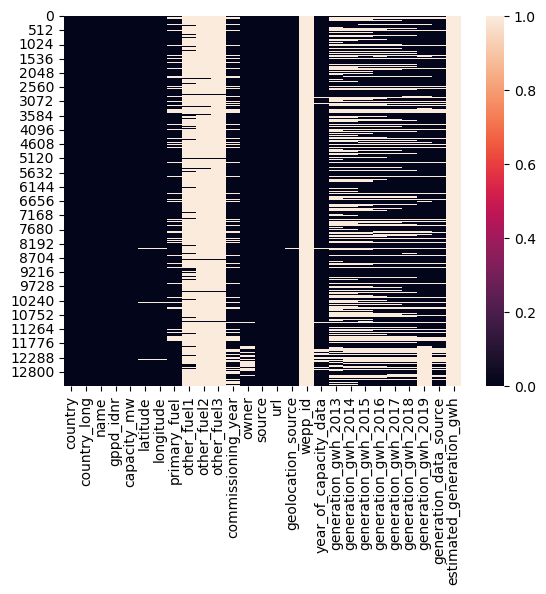

In [13]:
sns.heatmap(df.isnull())

In [14]:
# checking the duplicate values
df.duplicated().sum()

0

In [15]:
#seperating the numerical and categorical columns
#Categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col.append(i)
print("categorical columns:",categorical_col)
print("\n")

categorical columns: ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel', 'other_fuel1', 'other_fuel2', 'other_fuel3', 'owner', 'source', 'url', 'geolocation_source', 'generation_gwh_2019', 'generation_data_source']




In [16]:
#Numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col.append(i)
print("numerical columns:",numerical_col)
print("\n")

numerical columns: ['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'wepp_id', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018', 'estimated_generation_gwh']




# cleasing the dataset

In [17]:
 #dropping the columns because of they don't contribute to building a good model for predicting the target variable values
df.drop(columns=['country','country_long','name','gppd_idnr','url','generation_data_source','source'],inplace=True)
#dropping the columns because of they contain insufficient amount of data.
df.drop(columns=['estimated_generation_gwh','wepp_id','owner','other_fuel3','other_fuel2','other_fuel1'],inplace=True) #they contain insufficient amount of data.


In [18]:
df["year_of_capacity_data"].value_counts()

year_of_capacity_data
2019.0    12860
Name: count, dtype: int64

In [19]:
# checking the value counts of each column
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

capacity_mw
0.00       2030
5.00        552
1.00        534
2.00        479
1.50        267
           ... 
621.20        1
1058.50       1
1053.00       1
391.50        1
10.95         1
Name: count, Length: 2304, dtype: int64


latitude
 39.4360    7
 38.3026    6
 36.7160    5
 42.2060    5
 34.7231    5
           ..
 46.7659    1
 45.5180    1
 38.5967    1
 42.7811    1
-20.7620    1
Name: count, Length: 12385, dtype: int64


longitude
-76.2200     7
-114.6460    6
-121.2958    6
-118.2897    5
-117.3872    4
            ..
-75.3665     1
-70.8406     1
-93.0205     1
-81.1360     1
 116.7420    1
Name: count, Length: 12733, dtype: int64


primary_fuel
Solar           3480
Gas             2031
Hydro           1783
Wind            1340
Oil              961
Waste            595
Coal             572
Biomass          230
Storage          104
Nuclear           72
Geothermal        65
Cogeneration      34
Other             16
Petcoke           11
Name: count, dtype: int64


commissioni

In [20]:
df.drop(columns = 'year_of_capacity_data',inplace = True) #all the values in it are '2019.0

In [21]:
df.shape

(13298, 13)

In [22]:
#Categorical columns
categorical_col1=[]
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col1.append(i)
print("categorical columns1:",categorical_col1)
print("\n")

categorical columns1: ['primary_fuel', 'geolocation_source', 'generation_gwh_2019']




In [23]:
#Numerical columns
numerical_col1=[]
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col1.append(i)
print("numerical columns1:",numerical_col1)
print("\n")

numerical columns1: ['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018']




# Removing the null values

In [24]:
df.isnull().sum()

capacity_mw               6
latitude                 78
longitude                78
primary_fuel           2004
commissioning_year     2644
geolocation_source       23
generation_gwh_2013    6128
generation_gwh_2014    5764
generation_gwh_2015    5305
generation_gwh_2016    4597
generation_gwh_2017    4006
generation_gwh_2018    3440
generation_gwh_2019    3520
dtype: int64

In [25]:
df.primary_fuel.value_counts()

primary_fuel
Solar           3480
Gas             2031
Hydro           1783
Wind            1340
Oil              961
Waste            595
Coal             572
Biomass          230
Storage          104
Nuclear           72
Geothermal        65
Cogeneration      34
Other             16
Petcoke           11
Name: count, dtype: int64

In [26]:
df.geolocation_source.value_counts()

geolocation_source
U.S. Energy Information Administration                11833
WRI                                                     807
Australian Renewable Energy Mapping Infrastructure      512
Industry About                                          119
National Renewable Energy Laboratory                      4
Name: count, dtype: int64

In [27]:
df.geolocation_source.mode() 

0    U.S. Energy Information Administration
Name: geolocation_source, dtype: object

In [28]:
df.generation_gwh_2019.value_counts()

generation_gwh_2019
0.0                              366
0.001                             13
0.005                             12
0.003                              9
0.007                              9
                                ... 
324.594                            1
150.639                            1
51.005                             1
213.495571                         1
Central Electricity Authority      1
Name: count, Length: 8368, dtype: int64

In [29]:
pd.set_option('display.max_rows',None) #allow to display all rows of a DataFrame without any truncation

In [30]:
df["generation_gwh_2019"]

0                                  NaN
1                                2.467
2                                  NaN
3                                  NaN
4                                  NaN
5                                1.332
6                                  NaN
7                                1.417
8                                  NaN
9                                2.349
10                               2.303
11                             1.78101
12                                5.01
13                               0.024
14                                1.52
15                                 NaN
16                               2.659
17                                 0.0
18                                 NaN
19                               2.876
20                               5.074
21                               1.535
22                               2.656
23                                2.41
24                               4.025
25                       

There are only one value i.e. "Central Electricity Authority" which is not float except null values at row number 12181. so we can convert this value into null value. 

In [31]:
df.loc[12181, 'generation_gwh_2019'] = np.nan

In [32]:
df.dtypes

capacity_mw            float64
latitude               float64
longitude              float64
primary_fuel            object
commissioning_year     float64
geolocation_source      object
generation_gwh_2013    float64
generation_gwh_2014    float64
generation_gwh_2015    float64
generation_gwh_2016    float64
generation_gwh_2017    float64
generation_gwh_2018    float64
generation_gwh_2019     object
dtype: object

In [33]:
df['generation_gwh_2019'] = df['generation_gwh_2019'].astype(float) # converting the object data type into float 

In [34]:
df.dtypes

capacity_mw            float64
latitude               float64
longitude              float64
primary_fuel            object
commissioning_year     float64
geolocation_source      object
generation_gwh_2013    float64
generation_gwh_2014    float64
generation_gwh_2015    float64
generation_gwh_2016    float64
generation_gwh_2017    float64
generation_gwh_2018    float64
generation_gwh_2019    float64
dtype: object

In [35]:
#Removing null values in the object column
from sklearn.impute import SimpleImputer

si = SimpleImputer(missing_values = np.nan,strategy = 'most_frequent',verbose = 0 )
si = si.fit(df[['geolocation_source']])
df[['geolocation_source']] = si.transform(df[['geolocation_source']])

In [36]:
df[['geolocation_source']].isnull().sum()

geolocation_source    0
dtype: int64

In [37]:
si = si.fit(df[['primary_fuel']])
df[['primary_fuel']] = si.transform(df[['primary_fuel']])

In [38]:
df[['primary_fuel']].isnull().sum()

primary_fuel    0
dtype: int64

In [39]:
#Categorical columns
categorical_col2=[]
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col2.append(i)
print("categorical columns2:",categorical_col2)
print("\n")

categorical columns2: ['primary_fuel', 'geolocation_source']




In [40]:
#Numerical columns
numerical_col2=[]
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col2.append(i)
print("numerical columns2:",numerical_col2)
print("\n")

numerical columns2: ['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018', 'generation_gwh_2019']




In [41]:
#Removing null values in the float column
si=SimpleImputer(strategy='median')
for i in numerical_col2:
    df[i]=si.fit_transform(df[i].values.reshape(-1,1))
    


In [42]:
# checking the null values again
df.isnull().sum()

capacity_mw            0
latitude               0
longitude              0
primary_fuel           0
commissioning_year     0
geolocation_source     0
generation_gwh_2013    0
generation_gwh_2014    0
generation_gwh_2015    0
generation_gwh_2016    0
generation_gwh_2017    0
generation_gwh_2018    0
generation_gwh_2019    0
dtype: int64

<Axes: >

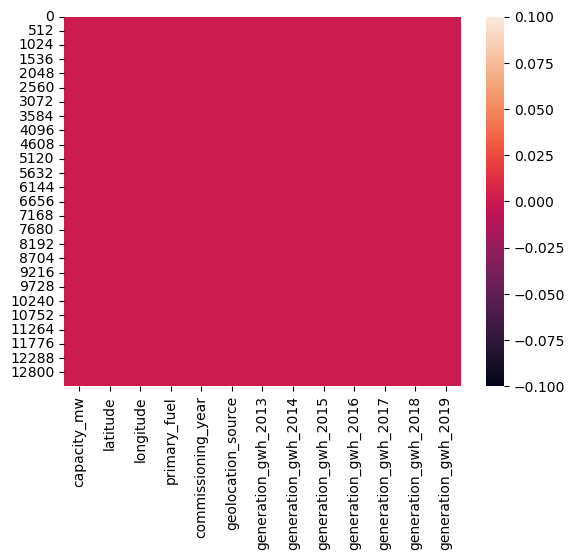

In [43]:
sns.heatmap(df.isnull())

Now, no null values are present in any column.

Extracting the age of Power plants from commissioning_year column will give a better insight into its relationship with target column data.

In [44]:
df['Age'] = df['commissioning_year'].apply(lambda y: 2024 - y) 

In [45]:
df.drop(columns=['commissioning_year'],inplace=True)

In [46]:
df.shape

(13298, 13)

# Data Visualization

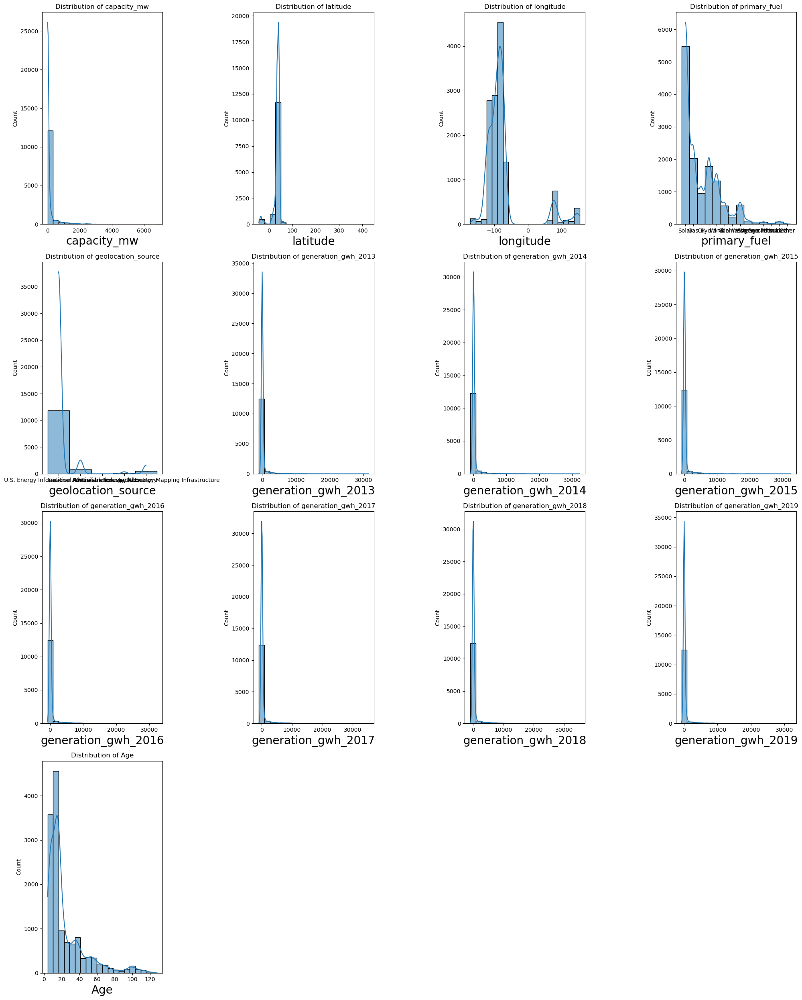

In [47]:
#checking  whether the graph is right skewed, left skewed or the graph is normally distributed graph
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for i in df.columns[0:15]:
    if plotnumber<=16:
        plt.subplot(4, 4, plotnumber)
        sns.histplot(df[i],kde=True,bins=20)
        plt.title(f'Distribution of {i}')
        plt.xlabel(i,fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

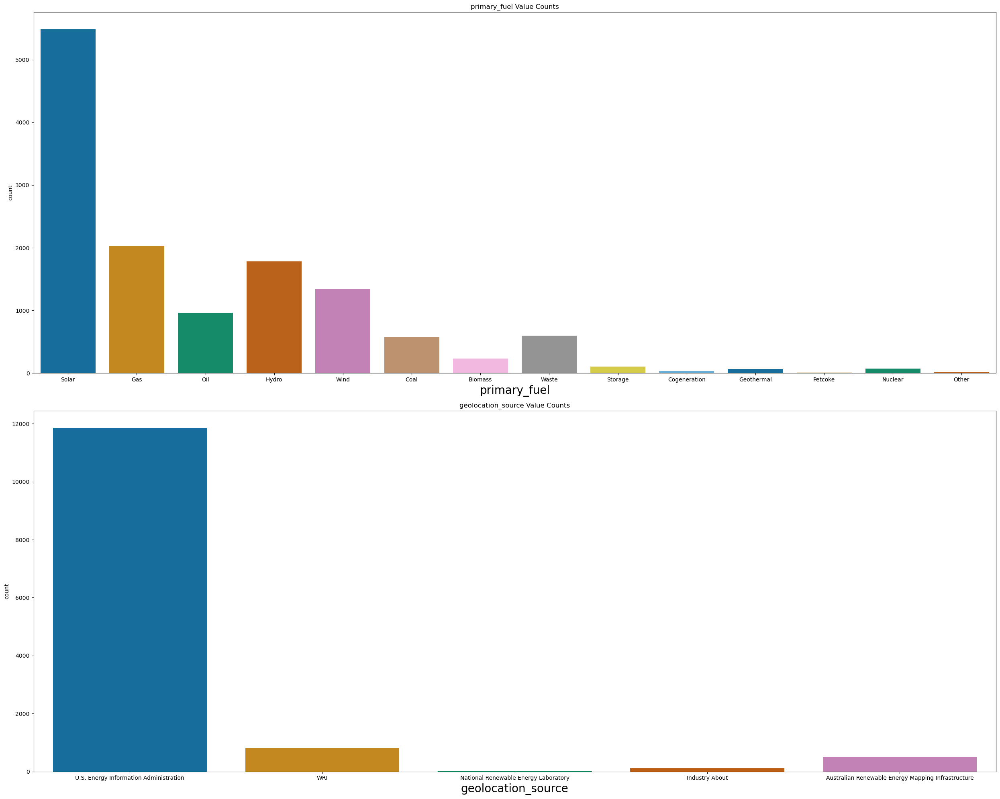

In [48]:
plt.figure(figsize=(25,20))
plotnumber=1
for i in categorical_col2:
    if plotnumber<=2:
        plt.subplot(2, 1, plotnumber)
        sns.countplot(x=df[i],palette='colorblind')
        plt.title(f'{i} Value Counts')
        plt.xlabel(i, fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [49]:
#Numerical columns
numerical_col2=[]
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col2.append(i)
print("numerical columns2:",numerical_col2)
print("\n")

numerical columns2: ['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018', 'generation_gwh_2019', 'Age']




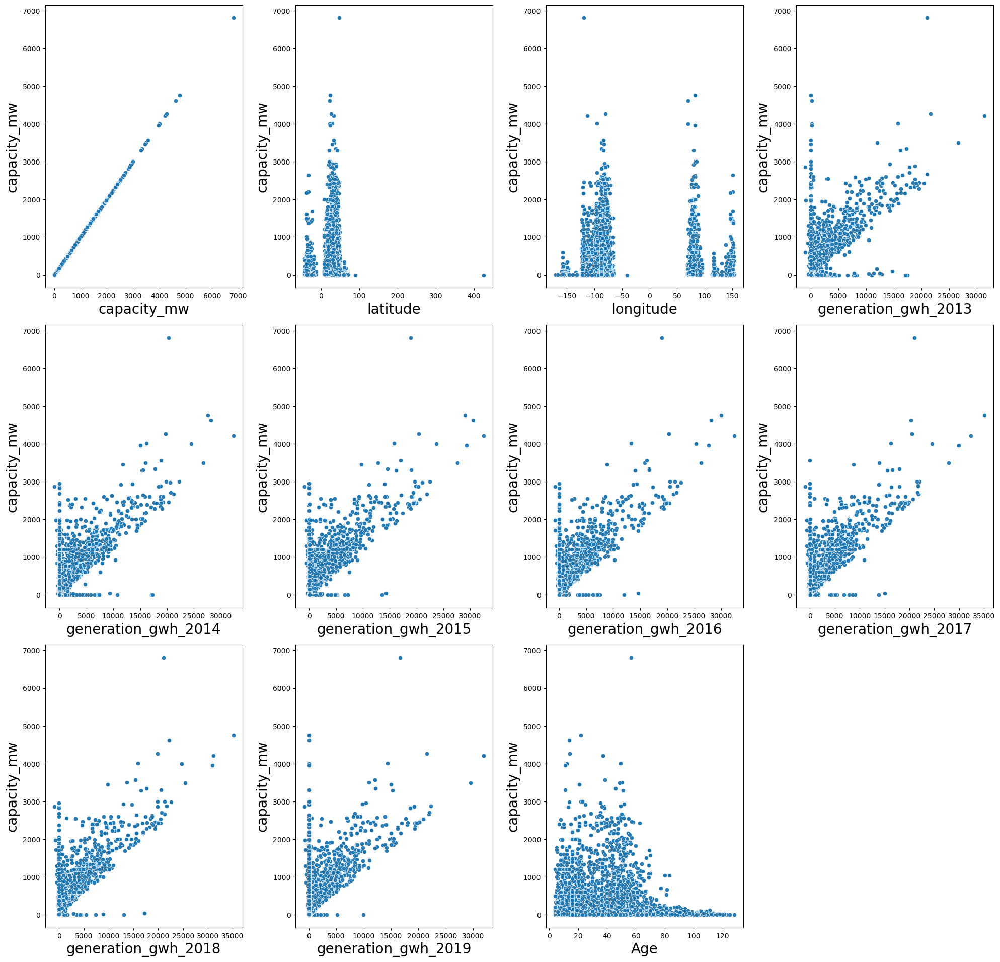

In [50]:
plt.figure(figsize=(20,25),facecolor='white')
plotnum=1

for i in numerical_col2:
    if plotnum<=16:
        plt.subplot(4,4,plotnum)
        sns.scatterplot(x=df[i],y=df['capacity_mw'])
        plt.xlabel(i,fontsize=20)
        plt.ylabel('capacity_mw',fontsize=20)
    plotnum+=1
plt.tight_layout()

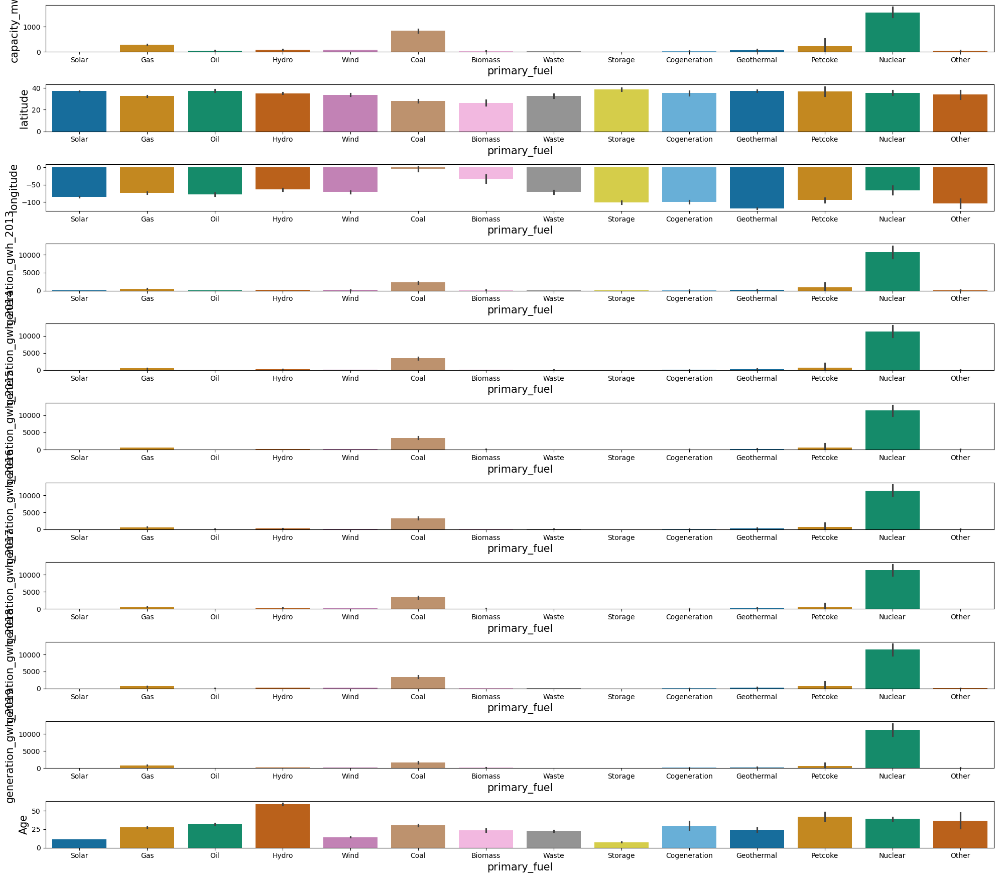

In [51]:

plt.figure(figsize=(20,25))
plotnumber=1
y_axis = df['primary_fuel']
x_axis = df.drop(columns=['primary_fuel','geolocation_source'])
for i in x_axis:
    if plotnumber<=16:
        plt.subplot(16, 1, plotnumber)
        sns.barplot(x=y_axis,y=x_axis[i], palette='colorblind')
        plt.xlabel('primary_fuel',fontsize=15)
        plt.ylabel(i,fontsize=15)
    plotnumber+=1
plt.tight_layout()


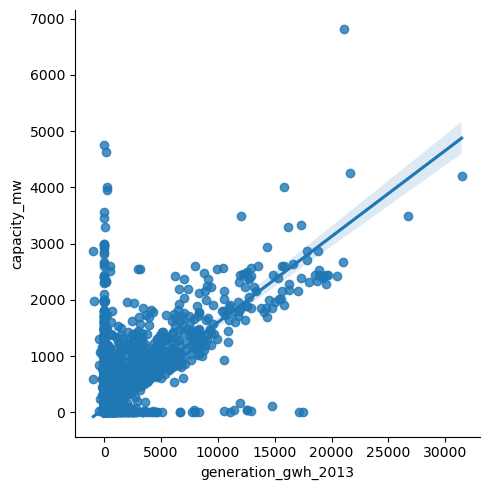

In [52]:
sns.lmplot(x = 'generation_gwh_2013' ,y = 'capacity_mw',data = df)

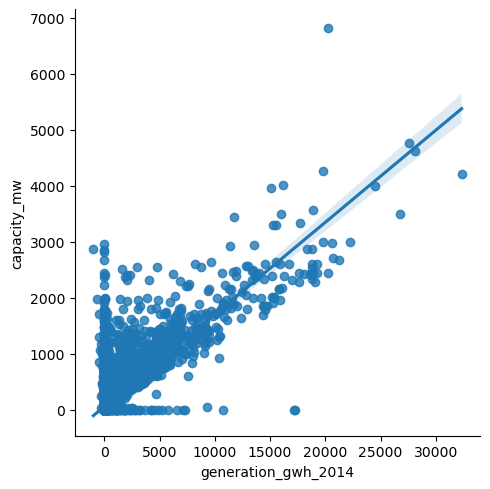

In [53]:
sns.lmplot(x = 'generation_gwh_2014' ,y = 'capacity_mw',data = df)

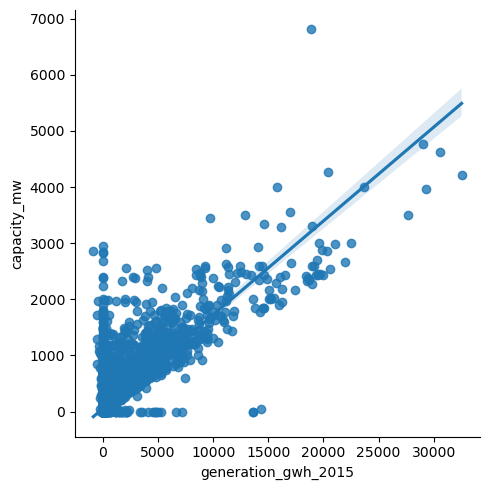

In [54]:
sns.lmplot(x = 'generation_gwh_2015' ,y = 'capacity_mw',data = df)

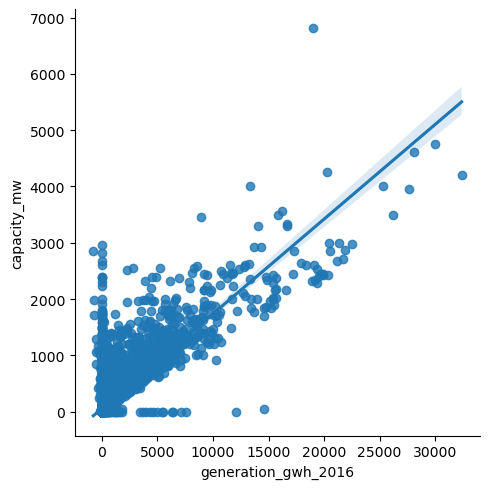

In [55]:
sns.lmplot(x = 'generation_gwh_2016' ,y = 'capacity_mw',data = df)

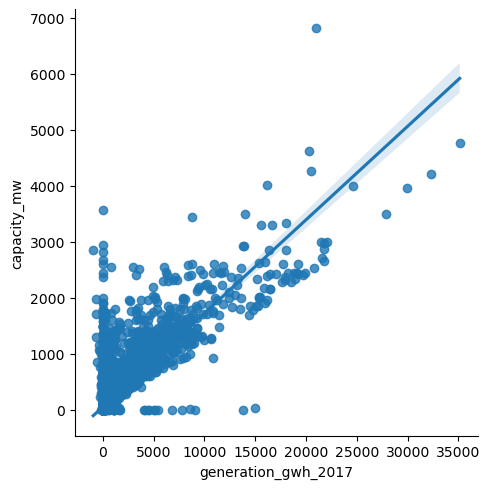

In [56]:
sns.lmplot(x = 'generation_gwh_2017' ,y = 'capacity_mw',data = df)

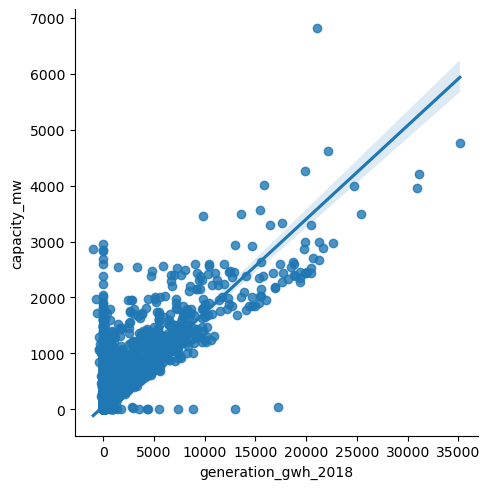

In [57]:
sns.lmplot(x = 'generation_gwh_2018' ,y = 'capacity_mw',data = df)

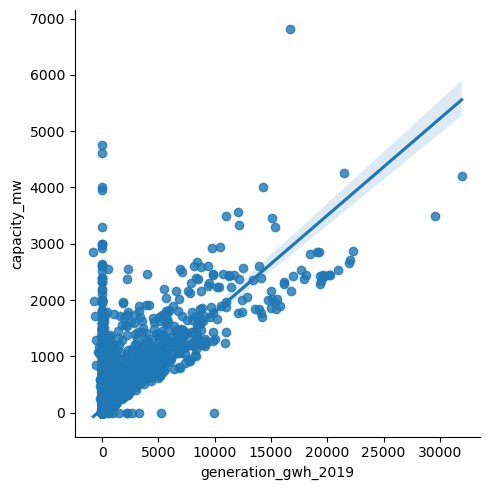

In [58]:
sns.lmplot(x = 'generation_gwh_2019' ,y = 'capacity_mw',data = df)

# Encoding the object datatype

In [59]:
#Encoding the object type columns using Label Encoder
from sklearn.preprocessing import LabelEncoder
df['geolocation_source']=LabelEncoder().fit_transform(df['geolocation_source'])
df['primary_fuel']=LabelEncoder().fit_transform(df['primary_fuel'])

In [60]:
# finding. the correlation between the columns
df.corr()

,capacity_mw,latitude,longitude,primary_fuel,geolocation_source,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,Age
capacity_mw,1.000000,-0.080457,0.127177,-0.362530,0.070508,0.667360,0.795624,0.814142,0.813790,0.812694,0.822004,0.725263,0.098155
latitude,-0.080457,1.000000,-0.775378,0.099356,0.683962,-0.023424,-0.052091,-0.054830,-0.058400,-0.060082,-0.060251,0.027170,0.056628
longitude,0.127177,-0.775378,1.000000,-0.166259,-0.451723,0.004637,0.092221,0.097495,0.103669,0.109114,0.112126,-0.058825,-0.031260
primary_fuel,-0.362530,0.099356,-0.166259,1.000000,-0.047139,-0.202419,-0.243460,-0.252103,-0.246693,-0.244411,-0.248388,-0.204489,-0.444105
geolocation_source,0.070508,0.683962,-0.451723,-0.047139,1.000000,-0.010392,0.048224,0.051124,0.053765,0.056035,0.059480,0.022774,0.027892
generation_gwh_2013,0.667360,-0.023424,0.004637,-0.202419,-0.010392,1.000000,0.827239,0.800063,0.767244,0.769788,0.739651,0.838772,0.104594
generation_gwh_2014,0.795624,-0.052091,0.092221,-0.243460,0.048224,0.827239,1.000000,0.969961,0.937811,0.919601,0.912850,0.756269,0.090152
generation_gwh_2015,0.814142,-0.054830,0.097495,-0.252103,0.051124,0.800063,0.969961,1.000000,0.964323,0.942955,0.941790,0.765927,0.081626
generation_gwh_2016,0.813790,-0.058400,0.103669,-0.246693,0.053765,0.767244,0.937811,0.964323,1.000000,0.969369,0.956269,0.762145,0.071632
generation_gwh_2017,0.812694,-0.060082,0.109114,-0.244411,0.056035,0.769788,0.919601,0.942955,0.969369,1.000000,0.966072,0.765051,0.068023


<Axes: >

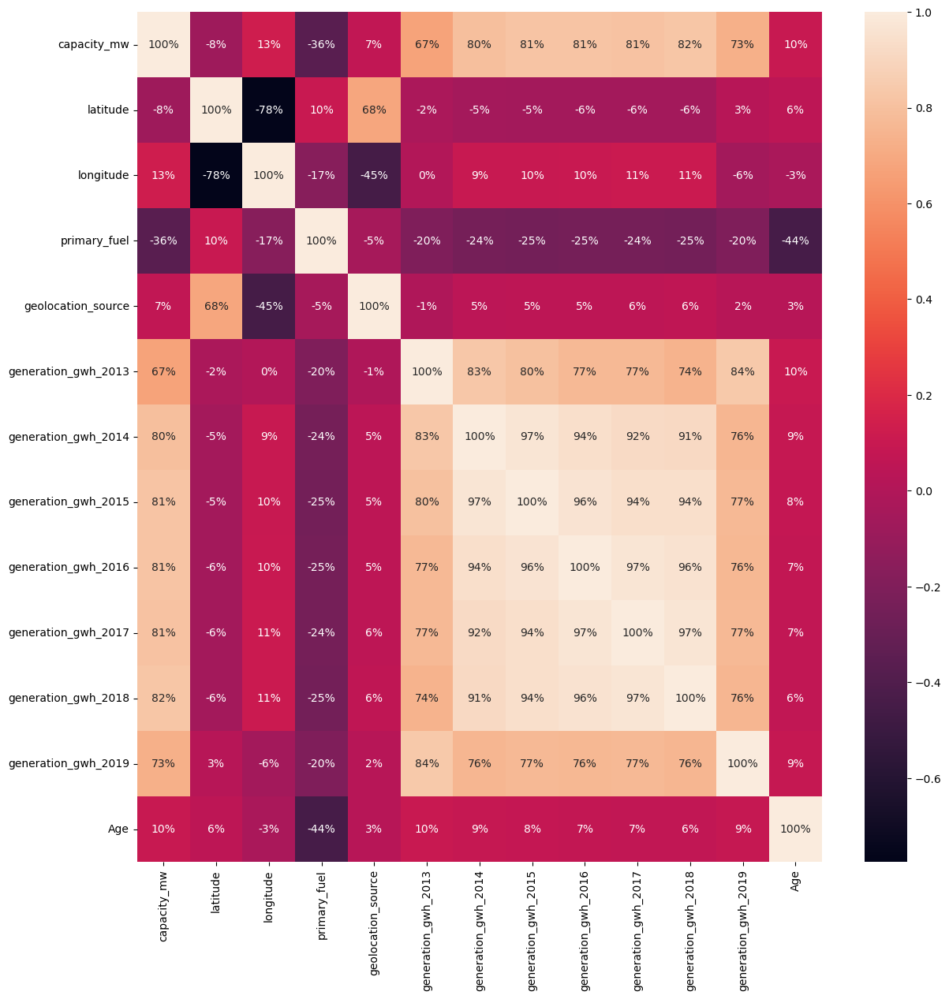

In [61]:
#Visualizing the correlation
plt.figure(figsize=(14,14))  
sns.heatmap(df.corr(), annot=True, fmt='.0%')

In [62]:
df.describe()

,capacity_mw,latitude,longitude,primary_fuel,geolocation_source,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,Age
count,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000,13298.000000
mean,117.688075,35.072784,-73.873706,7.808543,2.926982,313.618733,369.819541,378.520539,372.907810,376.112976,383.981725,313.205817,23.863591
std,347.098888,15.400938,62.692711,3.663874,0.661816,1515.223100,1678.509435,1690.892264,1678.766047,1689.845051,1704.730034,1462.785069,21.851731
min,0.000000,-42.888300,-171.712400,0.000000,0.000000,-947.600000,-989.619000,-864.428000,-768.620000,-934.944000,-982.622000,-780.339000,4.000000
25%,1.500000,33.914250,-104.583400,5.000000,3.000000,15.063500,12.718750,9.140750,6.400250,5.034250,4.088500,4.502500,10.000000
50%,5.500000,38.389750,-87.346000,10.000000,3.000000,21.384500,22.241000,19.504000,15.410278,13.433861,12.308500,11.280130,16.000000
75%,52.650000,42.166025,-75.535425,10.000000,3.000000,27.758750,34.949500,40.148450,45.893500,51.903250,56.527000,46.123750,30.500000
max,6809.000000,425.246100,153.434100,13.000000,4.000000,31431.080000,32320.917000,32525.595000,32377.477000,35116.000000,35136.000000,31920.368000,128.000000


Observations:- 1. there is huge difference between 75% and max since outliers are present in the dataset.
    2. data is right skewed mostly because of mean> median in columns.

capacity_mw                Axes(0.125,0.77;0.133621x0.11)
latitude                Axes(0.285345,0.77;0.133621x0.11)
longitude                Axes(0.44569,0.77;0.133621x0.11)
primary_fuel            Axes(0.606034,0.77;0.133621x0.11)
geolocation_source      Axes(0.766379,0.77;0.133621x0.11)
generation_gwh_2013       Axes(0.125,0.638;0.133621x0.11)
generation_gwh_2014    Axes(0.285345,0.638;0.133621x0.11)
generation_gwh_2015     Axes(0.44569,0.638;0.133621x0.11)
generation_gwh_2016    Axes(0.606034,0.638;0.133621x0.11)
generation_gwh_2017    Axes(0.766379,0.638;0.133621x0.11)
generation_gwh_2018       Axes(0.125,0.506;0.133621x0.11)
generation_gwh_2019    Axes(0.285345,0.506;0.133621x0.11)
Age                     Axes(0.44569,0.506;0.133621x0.11)
dtype: object

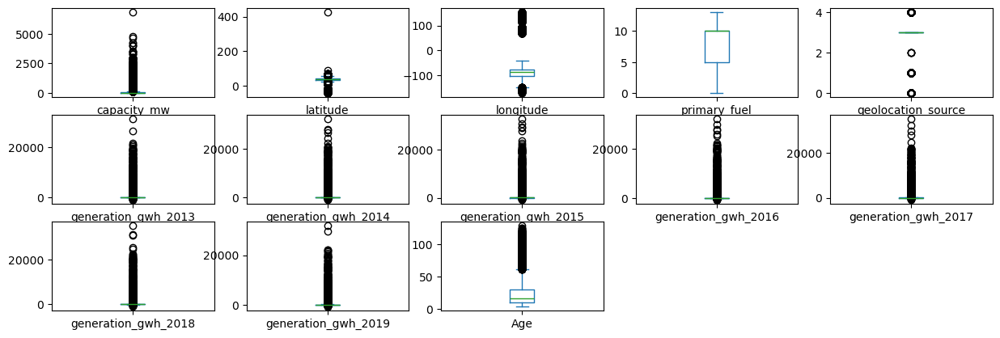

In [63]:
#Checking for outliers using boxplots
df.plot(kind='box',subplots=True,layout=(6,5),figsize=(15,10))

In [64]:
#Removing outliers using zscore
#from scipy.stats import zscore
#z=np.abs(zscore(df))
#threshold=3
#print(np.where(z<3))
#print(df.shape)
#Assign the value to df1 which are less than threshold value and removing outliers
#df1=df[(z<3).all(axis=1)]
#print(df.shape)-------(13298, 13)
#print('Shape after removing outliers:',df1.shape)-----(11886, 13)
#%data loss calculation
#loss_percent=((13298-11886)/13298)*100
#print(loss_percent)----10.6 

11% data loss is not acceptable. so we proceed further without removing the outliers

In [65]:
#Removing skewness
skew=('longitude','generation_gwh_2013','generation_gwh_2014','generation_gwh_2015','generation_gwh_2016','generation_gwh_2017','generation_gwh_2018','generation_gwh_2019')
for i in skew:
    if df.skew().loc[i]>0.55:
        df[i]=np.log1p(df[i])

In [66]:
# Again checking the skewness in data
df.skew()

capacity_mw            5.474716
latitude              -1.867000
longitude              0.542910
primary_fuel          -0.419215
geolocation_source    -3.293289
generation_gwh_2013    0.668809
generation_gwh_2014    0.686857
generation_gwh_2015    0.749099
generation_gwh_2016    0.817248
generation_gwh_2017    0.834273
generation_gwh_2018    0.838772
generation_gwh_2019    0.950421
Age                    2.028376
dtype: float64

In [67]:
#Splitting the independent and target variable in x and y1,y2 
x=df.drop(['capacity_mw', 'primary_fuel'],axis=1)
y1=df['capacity_mw']
y2=df['primary_fuel']

In [68]:
# checking the null values
x.isnull().sum()

latitude                   0
longitude              11918
geolocation_source         0
generation_gwh_2013       34
generation_gwh_2014       37
generation_gwh_2015       36
generation_gwh_2016       47
generation_gwh_2017       56
generation_gwh_2018       58
generation_gwh_2019       61
Age                        0
dtype: int64

In [69]:
#First remove the null values
si=SimpleImputer(strategy='median')
value=['longitude','generation_gwh_2013','generation_gwh_2014','generation_gwh_2015','generation_gwh_2016','generation_gwh_2017','generation_gwh_2018','generation_gwh_2019']
for i in value:
    x[i]=si.fit_transform(x[i].values.reshape(-1,1))

In [70]:
x.isnull().sum()

latitude               0
longitude              0
geolocation_source     0
generation_gwh_2013    0
generation_gwh_2014    0
generation_gwh_2015    0
generation_gwh_2016    0
generation_gwh_2017    0
generation_gwh_2018    0
generation_gwh_2019    0
Age                    0
dtype: int64

#checking the multicollinearity

In [71]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
    vif["Features"]=x.columns
    print(vif)

In [72]:
vif_cal()

    VIF Values             Features
0    13.152775             latitude
1    22.137904            longitude
2    38.876234   geolocation_source
3    12.330395  generation_gwh_2013
4    23.219849  generation_gwh_2014
5    26.129504  generation_gwh_2015
6    24.890571  generation_gwh_2016
7    25.308237  generation_gwh_2017
8    20.512514  generation_gwh_2018
9     8.287853  generation_gwh_2019
10    2.263989                  Age


In [73]:
# Dropping the highest VIF values
df.drop(columns=['generation_gwh_2015','geolocation_source'],axis=1, inplace=True)

In [74]:
df

,capacity_mw,latitude,longitude,primary_fuel,generation_gwh_2013,generation_gwh_2014,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,Age
0,0.000,41.63270,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,2.507983,16.000000
1,2.000,41.09300,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,1.243290,8.000000
2,0.000,36.28380,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,2.507983,16.000000
3,0.000,36.21670,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,2.507983,16.000000
4,0.000,36.14750,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,2.507983,16.000000
5,5.000,35.42730,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,0.846726,5.000000
6,0.000,35.91620,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,2.507983,16.000000
7,3.000,36.19710,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,0.882527,5.000000
8,0.000,34.77360,NaN,10,3.108369,3.145918,2.797908,2.669577,2.588403,2.507983,16.000000
9,1.900,40.20030,NaN,10,1.228063,1.208960,1.250475,1.186623,1.165336,1.208662,12.000000


In [75]:
x=df.drop(['capacity_mw', 'primary_fuel'],axis=1)

In [76]:
# checking the null values
x.isnull().sum()

latitude                   0
longitude              11918
generation_gwh_2013       34
generation_gwh_2014       37
generation_gwh_2016       47
generation_gwh_2017       56
generation_gwh_2018       58
generation_gwh_2019       61
Age                        0
dtype: int64

In [77]:
#First remove the null values
si=SimpleImputer(strategy='median')
value=['longitude','generation_gwh_2013','generation_gwh_2014','generation_gwh_2016','generation_gwh_2017','generation_gwh_2018','generation_gwh_2019']
for i in value:
    x[i]=si.fit_transform(x[i].values.reshape(-1,1))

In [78]:
#Using StandardScaler to scale the data 
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
x=scale.fit_transform(x)

In [79]:
x

array([[ 0.42595866, -0.16995388, -0.04972962, ..., -0.19355235,
        -0.21862823, -0.35987478],
       [ 0.39091402, -0.16995388, -0.04972962, ..., -0.19355235,
        -0.84224138, -0.72599227],
       [ 0.07863559, -0.16995388, -0.04972962, ..., -0.19355235,
        -0.21862823, -0.35987478],
       ...,
       [-3.72169137,  4.36098612, -0.04972962, ..., -0.5358374 ,
        -0.21862823, -0.35987478],
       [-3.9158232 ,  4.30468313, -0.0366651 , ...,  0.00722036,
        -0.21862823,  0.46388958],
       [-3.62555075,  3.24277157, -0.04972962, ...,  1.56364246,
        -0.21862823, -0.45140415]])

In [80]:
print("Number of NaN values after scaling:", np.isnan(x).sum())

Number of NaN values after scaling: 0


In [81]:
x1=x

In [82]:
y1.value_counts()

capacity_mw
0.000       2030
5.000        552
1.000        534
2.000        479
1.500        267
3.000        261
20.000       195
10.000       170
4.000        170
1.600        147
1.100        134
1.800        132
1.200        124
1.900        111
1.300        110
3.200         99
6.000         97
1.400         92
2.200         90
2.500         87
30.000        75
3.500         71
1.700         70
4.500         69
4.800         67
15.000        67
3.600         66
2.400         64
8.000         63
50.000        60
2.800         57
100.000       55
12.000        52
9.000         52
150.000       51
4.900         48
7.500         46
80.000        45
2.300         44
200.000       43
18.000        42
5.400         40
16.000        40
2.600         39
60.000        38
2.900         38
40.000        38
3.400         38
2.100         37
25.000        37
4.400         35
6.400         35
2.700         34
4.200         34
5.200         34
21.000        34
24.000        32
3.300         31
12

In [83]:
y2.value_counts()

primary_fuel
10    5484
3     2031
5     1783
13    1340
7      961
12     595
1      572
0      230
11     104
6       72
4       65
2       34
8       16
9       11
Name: count, dtype: int64

target variable y1(capacity mW) have the decimal values so we build the Regression model for it. and y2 have the discrete values which are more than 2 (also imbalanced) so we build the classification model for it.


# When the Target Variable is Capacity_mW (y1)

In [91]:
#Finding best Random state
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso,Ridge,ElasticNet
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score


maxR2S=0
maxRS=0
for i in range(50,100):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=.30,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    predlr=lr.predict(x_test)
    r2score=r2_score(y_test,predlr)
    if r2score>maxR2S:
        maxR2S=r2score
        maxRS=i
print('Best accuracy is',maxR2S,'on Random_state',maxRS)

Best accuracy is 0.3659087623279632 on Random_state 98


In [92]:
#Model Building
x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=0.30, random_state=98)

In [93]:
model=[LinearRegression(),DecisionTreeRegressor(),KNeighborsRegressor(), AdaBoostRegressor(),GradientBoostingRegressor(),RandomForestRegressor(), Lasso(alpha=.00001),Ridge(alpha=.00001),ElasticNet(alpha=.00001)]
for m1 in model:
    m1.fit(x_train,y_train)
    predm1=m1.predict(x_test)
    print("error:")
    print("Mean squared error:", mean_squared_error(y_test, predm1))
    print("Mean absolute error:", mean_absolute_error(y_test, predm1))
    print("Root Mean squared error:", np.sqrt(mean_squared_error(y_test, predm1)))
    print("R2 Score of ",m1,"is: ",r2_score(y_test, predm1))
    sc=cross_val_score(m1,x1,y1,cv=5,scoring='r2')
    print('Cross validation score of',m1,"is: ",sc.mean())
    print("Difference between r2 score and cross validation score is", r2_score(y_test, predm1)-sc.mean())
    print()
    print()
    print()
    print() 

error:
Mean squared error: 85434.40528699214
Mean absolute error: 158.08442850922813
Root Mean squared error: 292.29164423053925
R2 Score of  LinearRegression() is:  0.3659087623279632
Cross validation score of LinearRegression() is:  0.26224714443084673
Difference between r2 score and cross validation score is 0.10366161789711648




error:
Mean squared error: 46509.63107294192
Mean absolute error: 63.949671129436496
Root Mean squared error: 215.6609168879283
R2 Score of  DecisionTreeRegressor() is:  0.6548071069068262
Cross validation score of DecisionTreeRegressor() is:  0.5616275663968794
Difference between r2 score and cross validation score is 0.09317954050994681




error:
Mean squared error: 32283.98637947056
Mean absolute error: 56.03024962406015
Root Mean squared error: 179.67745094883375
R2 Score of  KNeighborsRegressor() is:  0.7603893558856143
Cross validation score of KNeighborsRegressor() is:  0.683336920749905
Difference between r2 score and cross validation score is 0.

RandomForestRegressor has the highest r2 score which is 81% (this may be due to overfitting). so we also checked the cross validation for actual accuracy. After Cross Validation, we found out that the minimum difference between the r2 score and cross validation score is .06 which is given by GradientBoostingRegresso. Final model is GradientBoostingRegressor which has the 79.8% actual accuracy (r2 score).

In [94]:
#Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
}

gbr = GradientBoostingRegressor()
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(x_train, y_train)
print(grid_search.best_params_)
print(grid_search.best_score_)

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
0.8236094957383162


r2 score(accuracy) is increased by 2%.

In [95]:
Finalmodel=GradientBoostingRegressor(n_estimators=200,learning_rate=0.1,max_depth=3)
Finalmodel.fit(x_train,y_train)
pred=Finalmodel.predict(x_test)
print("R2_score:",r2_score(y_test, pred))
print("Mean squared error:", mean_squared_error(y_test, pred))
print("Mean absolute error:", mean_absolute_error(y_test, pred))
print("Root Mean squared error:", np.sqrt(mean_squared_error(y_test, pred)))

R2_score: 0.8049474735446185
Mean squared error: 26280.43979699312
Mean absolute error: 55.35567885671748
Root Mean squared error: 162.112429495684


In [96]:
import pickle
filename='GlobalPowerPlant_Capacity_Regressor.pkl'
pickle.dump(Finalmodel,open(filename,'wb'))

In [97]:
loaded_model=pickle.load(open('GlobalPowerPlant_Capacity_Regressor.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

80.49474735446185


In [98]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=("predicted","original"))
conclusion

,0,1,2,3,4,5,6,7,8,9,...,3980,3981,3982,3983,3984,3985,3986,3987,3988,3989
predicted,4.474946,10.076197,25.609017,5.763273,10.319838,61.18053,40.624506,-9.761277,109.584726,12.72547,...,10.076197,67.626275,4.305038,495.928512,20.763758,4.373015,4.305038,36.319257,0.320374,10.076197
original,0.000000,0.000000,3.600000,3.000000,5.400000,180.60000,3.800000,11.500000,42.000000,14.40000,...,0.000000,200.000000,0.000000,450.000000,4.000000,1.600000,0.000000,15.000000,1.300000,0.000000


# When the Target Variable is primary_fuel 

In [112]:
import sklearn
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

#Finding best Random state
maxAccu=0
maxRS=0
for i in range(50,100):
    x3_train,x3_test,y3_train,y3_test=train_test_split(x1,y2,test_size=.30,random_state=i)
    dtc=DecisionTreeClassifier()
    dtc.fit(x3_train,y3_train)
    preddtc=dtc.predict(x3_test)
    acc=accuracy_score(y3_test,preddtc)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is',maxAccu,'on Random_state',maxRS)

Best accuracy is 0.7305764411027569 on Random_state 61


In [113]:
#Model Building
x3_train, x3_test, y3_train, y3_test = train_test_split(x1, y2, test_size=0.30, random_state=61)

In [114]:
model1=[GaussianNB(),DecisionTreeClassifier(),ExtraTreeClassifier(),KNeighborsClassifier(),SVC(),RandomForestClassifier(), GradientBoostingClassifier()]
for m2 in model1:
    m2.fit(x3_train,y3_train)
    predm2=m2.predict(x3_test)
    print("Accuracy of",m2,"is:   ",accuracy_score(y3_test,predm2))
    print(confusion_matrix(y3_test,predm2))
    print(classification_report(y3_test,predm2))
   
    scr1=cross_val_score(m2,x3,y3,cv=5,scoring='accuracy')
    print(scr1.mean())
    print("Difference between accuracy score and cross validation score is", accuracy_score(y3_test, predm2)-scr1.mean())

    print()
    print()
    print()  

Accuracy of GaussianNB() is:    0.08421052631578947
[[   6    0    6    0   13    0    0    0    1    3   22   13    0    0]
 [   4   44    6    6   24    0   45    1    3   10   24    1    1   10]
 [   0    0    4    0    4    0    0    0    0    1    0    4    0    0]
 [  13   14  105    6  199    3   50   21   29   70    7   70   12    7]
 [   0    0    0    0   13    0    0    0    0    1    0    0    0    0]
 [  13   10   38    5   83   46   10    3  250   35   11   18    7   12]
 [   0    1    0    0    0    0   16    0    0    0    0    1    0    0]
 [  13    1    8    0    6    0    1  122   18   90    9   16    3    0]
 [   0    0    1    0    1    0    0    0    1    0    0    1    0    0]
 [   0    0    2    0    1    0    1    0    0    0    0    0    0    0]
 [  16    1   78    1   87    0    0   14    2    0   46 1458    2    1]
 [   0    0    0    0    0    0    0    0    0    0    0   26    0    0]
 [  10    0   12    0   76    0    0    1    9    5    4   36    3    0]

RandomForestClassifier() has the highest accuracy which is 79.6% (this may be due to overfitting or underfitting). so we also checked the cross validation of each model for actual accuracy. After Cross Validation, we found out that the minimum difference between the accuracy score and cross validation score is .016 which is given by GradientBoostingClassifier(). Final model is GradientBoostingClassifier() which has the 77% actual accuracy (accuracy score).

In [115]:
#Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
}
gbc = GradientBoostingClassifier()

#Applying GridSearchCV to get the best value for hyperparameters
grid = GridSearchCV(estimator=gbc, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(x3_train, y3_train)




GridSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 200]},
             scoring='accuracy')

In [116]:
print(grid.best_params_)
print(grid.best_score_)

{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}
0.7708421087261794


In [118]:
Final_Model=GradientBoostingClassifier(n_estimators=200,max_depth=7,learning_rate=0.1)
Final_Model.fit(x3_train,y3_train)
predf=Final_Model.predict(x3_test)
accf=accuracy_score(y3_test,predf)
print(accf)

0.7972431077694235


In [122]:
#saving the model
import pickle
filename='GlobalPowerPlant_primaryfuel_classification.pkl'
pickle.dump(Final_Model,open(filename,'wb'))

In [123]:
loaded_model1=pickle.load(open('GlobalPowerPlant_primaryfuel_classification.pkl','rb'))
result1=loaded_model1.score(x3_test,y3_test)
print(result1*100)

79.72431077694236


In [125]:
conclusion=pd.DataFrame([loaded_model1.predict(x3_test)[:],y3_test[:]],index=("predicted","original"))
conclusion

,0,1,2,3,4,5,6,7,8,9,...,3980,3981,3982,3983,3984,3985,3986,3987,3988,3989
predicted,10,13,10,10,12,6,10,7,13,10,...,12,13,10,5,10,3,7,5,10,10
original,10,13,10,10,10,6,10,10,3,10,...,3,13,10,1,10,3,7,5,3,10
